# 1. 固定参考与切片输入

参考为CID4471、CID4535，先拟合原13类，再把CD4、CD8、NKT、Cycling T汇总为T cells。NK单独保留。

CID4535沿用旧模型的1102个spot和15770个基因，用于新旧参考对照。其他切片按相同质控规则处理；两张切片缺少模板中的189个原名基因，使用15581个交集基因，不猜测别名或补零。

输入由prepare_multislice_spatial.py生成。先运行run_multislice_spatial.R CID4535并审核，再拟合其他切片。下面从保存的模型输出计算汇总和表达核对，不重新拟合。


In [1]:
from pathlib import Path
import json
import runpy
import subprocess
import pandas as pd
from IPython.display import display, Image, Markdown
root = Path("/Users/georicl/Documents/sc_sncell_github")
result_dir = root / "results/Wu2021_multislice_CAF_T_v1"
protocol = json.loads((result_dir / "protocol.json").read_text())
samples = protocol["samples"]
display(pd.read_csv(result_dir / "slice_inventory.csv"))
display(pd.read_csv(result_dir / "reference_inventory.csv"))


,sample_id,subtype,n_before,n_outside,n_artefact,n_excluded,n_retained,missing_pathology,uncertain_pathology,model_genes,omitted_genes,model_umi_min,model_umi_median,full_umi_median,reference_overlap
0,CID4535,ER,1127,2,23,25,1102,1,73,15770,0,646,12478.5,12883.0,True
1,CID4290,ER,2432,6,7,13,2419,0,0,15770,0,706,7658.0,7875.0,False
2,CID4465,TNBC,1211,0,4,4,1207,0,0,15770,0,1083,11019.0,11304.0,False
3,CID44971,TNBC,1162,2,1,3,1159,0,0,15770,0,602,9831.0,10136.0,False
4,1142243F,TNBC,4784,0,119,119,4665,0,0,15581,189,13,5193.0,5445.0,False
5,1160920F,TNBC,4895,0,48,48,4847,1,0,15581,189,156,10821.0,11258.0,False


,donor_id,reference_label,n_cells
0,CID4471,B-cells,99
1,CID4471,CAFs,1292
2,CID4471,Cancer Epithelial,212
3,CID4471,Cycling T-cells,8
4,CID4471,Endothelial,2778
5,CID4471,Myeloid,285
6,CID4471,NK cells,30
7,CID4471,NKT cells,32
8,CID4471,Normal Epithelial,1966
9,CID4471,PVL,1285


# 2. 按切片汇总CAF/T和表达面板

各切片独立计算T、CAF及NK相关表达面板，不跨切片计算总体相关。表达面板来自同一RNA数据，用来核对表达一致性。

作者标记Artefact或组织外的spot排除。缺少病理标签或Uncertain的spot仍可用于表达分析，但不参与病理区域汇总。模型额外排除的spot单独记录。


In [2]:
evaluation = runpy.run_path(str(root / "src/sc_sncell_github/evaluate_multislice_spatial.py"))
evaluation["main"](samples)
display(pd.read_csv(result_dir / "completed_slice_summary.csv"))


sample_id subtype  n_qc_retained  n_fitted  n_model_removed  T_median_pct  CAF_median_pct  NK_median_pct  T_high_count  T_high_low_marker  CAF_high_low_marker  gene_count
  CID4535      ER           1102      1102                0      5.983345        2.627222       0.008981           111                  0                    0       15770
  CID4290      ER           2419      2419                0      0.749820       11.064305       0.006511           242                166                    1       15770
  CID4465    TNBC           1207      1207                0     14.691495       29.062630       0.007332           121                  9                    0       15770
 CID44971    TNBC           1159      1159                0     13.134815       11.564341       0.010647           116                  1                    0       15770
 1142243F    TNBC           4665      4662                3     10.294942        8.978131       0.006620           467                140        

,sample_id,subtype,n_qc_retained,n_fitted,n_model_removed,T_median_pct,CAF_median_pct,NK_median_pct,T_high_count,T_high_low_marker,CAF_high_low_marker,gene_count
0,CID4535,ER,1102,1102,0,5.983345,2.627222,0.008981,111,0,0,15770
1,CID4290,ER,2419,2419,0,0.749820,11.064305,0.006511,242,166,1,15770
2,CID4465,TNBC,1207,1207,0,14.691495,29.062630,0.007332,121,9,0,15770
3,CID44971,TNBC,1159,1159,0,13.134815,11.564341,0.010647,116,1,0,15770
4,1142243F,TNBC,4665,4662,3,10.294942,8.978131,0.006620,467,140,5,15581
5,1160920F,TNBC,4847,4847,0,13.446064,4.085442,0.009179,485,9,2,15581


# 3. 比较CID4535新旧参考

并列图的新旧权重使用相同色阶。差值图为新减旧，另外标记两套参考共同较高以及仅一套较高的区域。高权重定义为每类最高10%的spot。


,cell_type,spearman,mean_abs_change_pp,rmse_change_pp,mean_change_pp,old_mean_pct,new_mean_pct,top_k,top_overlap,top_retention
0,B-cells,0.789811,0.743200,1.340568,0.058389,1.717758,1.776147,111,82,0.738739
1,CAFs,0.979821,2.132457,3.196694,-2.102613,7.276878,5.174265,111,102,0.918919
2,Cancer Epithelial,0.993719,5.147828,6.840418,5.124866,68.866388,73.991254,111,86,0.774775
3,Endothelial,0.852575,0.799399,1.081480,-0.662933,2.565764,1.902831,111,94,0.846847
4,Myeloid,0.992587,0.495854,0.754753,0.408980,5.333752,5.742732,111,104,0.936937
5,NK cells,0.649981,0.233927,0.595421,0.067878,0.261696,0.329574,111,67,0.603604
6,Normal Epithelial,0.616232,0.909380,1.688063,-0.205486,1.347626,1.142140,111,69,0.621622
7,PVL,0.656435,0.573528,1.183828,-0.307795,0.902991,0.595196,111,72,0.648649
8,Plasmablasts,0.791224,2.639545,5.048446,-2.639545,3.047904,0.408358,111,108,0.972973
9,T cells,0.958632,1.477435,2.229126,0.258258,8.679244,8.937502,111,90,0.810811


,cell_type,marker_panel,old_spearman,new_spearman
0,CAFs,CAF,0.904829,0.898049
1,T cells,T,0.810794,0.803730
2,NK cells,NK,0.390902,0.309859


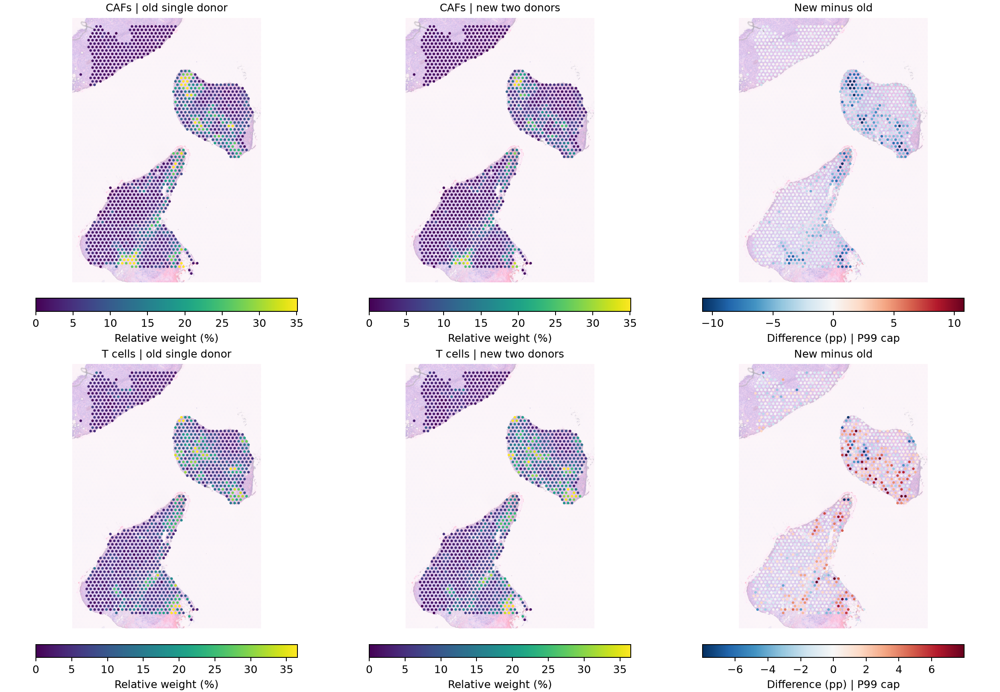

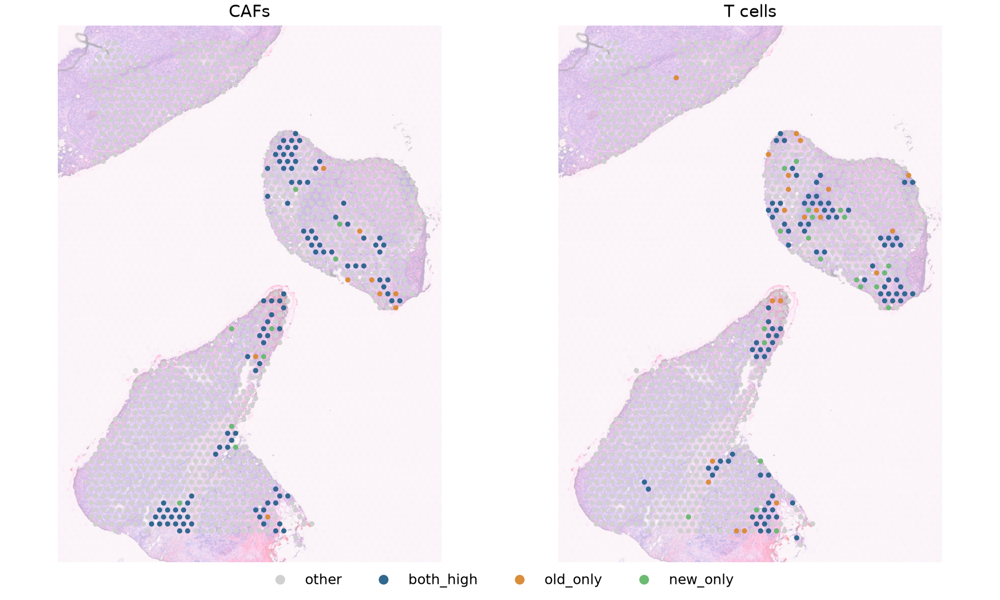

In [3]:
display(pd.read_csv(result_dir / "CID4535/reference_comparison_metrics.csv"))
display(pd.read_csv(result_dir / "CID4535/reference_expression_concordance.csv"))
display(Image(filename=str(result_dir / "CID4535/old_new_CAF_T.png")))
display(Image(filename=str(result_dir / "CID4535/reference_high_spot_agreement.png")))


# 4. 查看扩展切片

总览图使用统一T权重色阶，标题保留作者亚型。ER与TNBC分别阅读，TNBC是ER参考的跨亚型应用检查。

各片的CAF/T/NK权重与表达并列图，以及逐spot分歧标记，分别保存在对应目录。


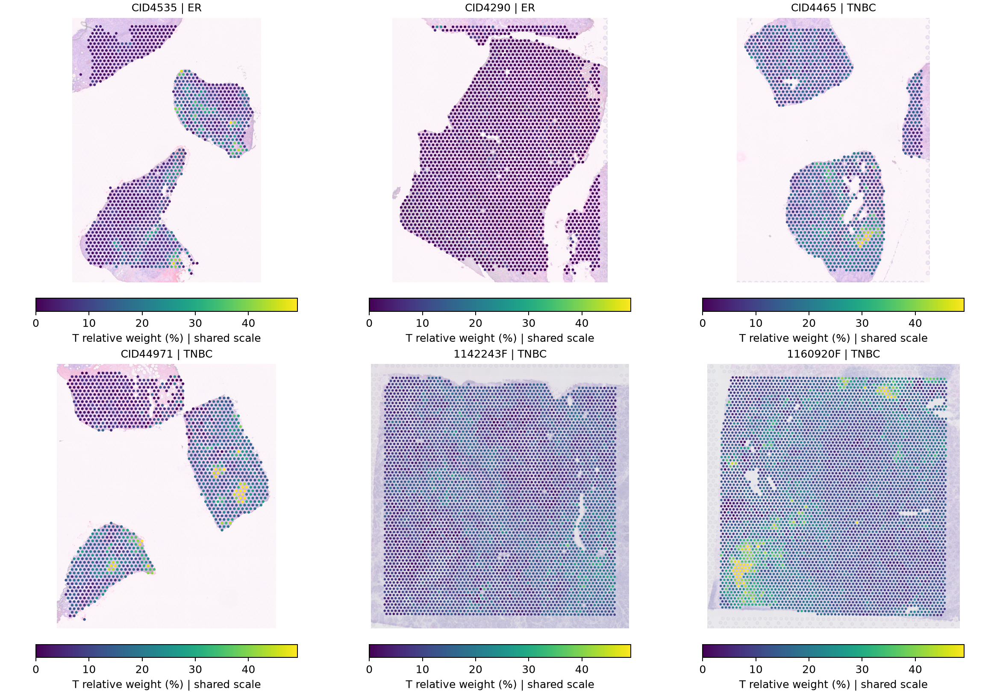

,sample_id,subtype,cell_type,marker_panel,spearman,n_spots
0,CID4535,ER,T cells,T,0.803730,1102
9,CID4290,ER,T cells,T,0.300855,2419
18,CID4465,TNBC,T cells,T,0.392473,1207
27,CID44971,TNBC,T cells,T,0.561917,1159
36,1142243F,TNBC,T cells,T,0.377410,4662
45,1160920F,TNBC,T cells,T,0.628493,4847


[CID4535权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/CID4535/CAF_T_NK_expression.png)

[CID4290权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/CID4290/CAF_T_NK_expression.png)

[CID4465权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/CID4465/CAF_T_NK_expression.png)

[CID44971权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/CID44971/CAF_T_NK_expression.png)

[1142243F权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/1142243F/CAF_T_NK_expression.png)

[1160920F权重与表达图](/Users/georicl/Documents/sc_sncell_github/results/Wu2021_multislice_CAF_T_v1/1160920F/CAF_T_NK_expression.png)

In [4]:
display(Image(filename=str(result_dir / "all_slices_T_atlas.png")))
markers = pd.read_csv(result_dir / "all_marker_concordance.csv")
display(markers[markers.cell_type.eq("T cells") & markers.marker_panel.eq("T")])
for sample in samples:
    display(Markdown(f"[{sample}权重与表达图]({result_dir / sample / 'CAF_T_NK_expression.png'})"))


# 5. 核验本轮全部结果

检查源文件哈希、参考计数、矩阵顺序和坐标，复算权重归一化、粗分类汇总、表达面板、相关及CID4535新旧差异。另从RDS读取权重与CSV逐项核对。

此前七个计算核验脚本已通过recheck_previous_results.py重新运行，日志在previous_result_review。


In [5]:
validation = runpy.run_path(str(root / "src/sc_sncell_github/validate_multislice_spatial.py"))
validation["main"](samples)
subprocess.run(["Rscript", str(root / "src/sc_sncell_github/validate_multislice_spatial.R"), *samples], check=True)
display(pd.read_json(result_dir / "previous_result_review/review_status.json"))


Checks: 265 / 265


Loading required namespace: SpatialExperiment


$CID4535_rds_csv
[1] TRUE

$CID4535_normalization
[1] TRUE

$CID4535_parameters
[1] TRUE

$CID4290_rds_csv
[1] TRUE

$CID4290_normalization
[1] TRUE

$CID4290_parameters
[1] TRUE

$CID4465_rds_csv
[1] TRUE

$CID4465_normalization
[1] TRUE

$CID4465_parameters
[1] TRUE

$CID44971_rds_csv
[1] TRUE

$CID44971_normalization
[1] TRUE

$CID44971_parameters
[1] TRUE

$`1142243F_rds_csv`
[1] TRUE

$`1142243F_normalization`
[1] TRUE

$`1142243F_parameters`
[1] TRUE

$`1160920F_rds_csv`
[1] TRUE

$`1160920F_normalization`
[1] TRUE

$`1160920F_parameters`
[1] TRUE



,script,exit_code,log
0,audit_pipeline_to_qc.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
1,validate_known_composition.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
2,validate_reference_comparison.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
3,validate_independent_validation.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
4,validate_tcell_validation.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
5,validate_tcell_label_review.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...
6,validate_coarse_tcells.py,0,results/Wu2021_multislice_CAF_T_v1/previous_re...


# 6. 汇总本轮结果


In [6]:
runpy.run_path(str(root / "src/sc_sncell_github/summarize_multislice_spatial.py"))
display(Markdown((result_dir / "interpretation.md").read_text()))


# 双供者参考与多切片CAF/T分析

## 1. 本轮完成的工作

固定CID4471和CID4535作为参考，保留原13类拟合，再汇总CD4、CD8、NKT和Cycling T为T细胞大类；NK单独保留。没有修改原作者细胞标签，也没有重新使用CD8特异权重进行空间解释。
先在CID4535上核对与旧模型完全相同的1102个spot和15770个输入基因，完成双供者拟合、新旧分布对照与表达核验，再扩展到其余5张本地Wu切片。
六张切片共有15611个原始spot，按作者Artefact与组织外标记的并集排除212个，保留15399个。RCTD最终拟合15396个，模型另外排除3个。

## 2. CID4535的新旧参考对照

| 类型 | 空间排序相关 | 平均绝对变化（百分点） | 最高10%重叠 | 旧/新表达相关 |
|---|---:|---:|---:|---:|
| CAFs | 0.980 | 2.13 | 102/111（91.9%） | 0.905/0.898 |
| T cells | 0.959 | 1.48 | 90/111（81.1%） | 0.811/0.804 |

新旧参考保留了主要空间格局，但权重大小及部分高权重spot发生变化。双供者参考没有提高这两类的表达面板相关性；本轮作用是统一参考、记录敏感区域，不把换参考本身称为准确性提升。
reference_high_spot_agreement.png展示两套参考共同较高及仅一套较高的区域；reference_comparison_by_spot.csv保留全部变化。CID4535本身也参与参考构建，这不是未见供者的空间验证。
逐spot对照表还关联了既有单供者参考的10次重抽样高权重频率和标准差，供共同阅读。本轮没有重跑双供者参考的bootstrap，不把旧参考重抽样当作新参考的不确定性估计。

## 3. 六张切片的表达核对

T面板为CD3D、CD3E、CD3G、TRAC、TRBC1、TRBC2；CAF面板为COL1A1、COL1A2、DCN、LUM；NK相关面板为NKG7、GNLY、KLRD1。分数为按完整空间文库归一化后的平均log1p(CP10k)。

| 切片 | 作者亚型 | QC保留/拟合 | T表达相关 | CAF表达相关 | 高T但低T表达 |
|---|-

# 双供者参考与多切片CAF/T分析

## 1. 本轮完成的工作

固定CID4471和CID4535作为参考，保留原13类拟合，再汇总CD4、CD8、NKT和Cycling T为T细胞大类；NK单独保留。没有修改原作者细胞标签，也没有重新使用CD8特异权重进行空间解释。
先在CID4535上核对与旧模型完全相同的1102个spot和15770个输入基因，完成双供者拟合、新旧分布对照与表达核验，再扩展到其余5张本地Wu切片。
六张切片共有15611个原始spot，按作者Artefact与组织外标记的并集排除212个，保留15399个。RCTD最终拟合15396个，模型另外排除3个。

## 2. CID4535的新旧参考对照

| 类型 | 空间排序相关 | 平均绝对变化（百分点） | 最高10%重叠 | 旧/新表达相关 |
|---|---:|---:|---:|---:|
| CAFs | 0.980 | 2.13 | 102/111（91.9%） | 0.905/0.898 |
| T cells | 0.959 | 1.48 | 90/111（81.1%） | 0.811/0.804 |

新旧参考保留了主要空间格局，但权重大小及部分高权重spot发生变化。双供者参考没有提高这两类的表达面板相关性；本轮作用是统一参考、记录敏感区域，不把换参考本身称为准确性提升。
reference_high_spot_agreement.png展示两套参考共同较高及仅一套较高的区域；reference_comparison_by_spot.csv保留全部变化。CID4535本身也参与参考构建，这不是未见供者的空间验证。
逐spot对照表还关联了既有单供者参考的10次重抽样高权重频率和标准差，供共同阅读。本轮没有重跑双供者参考的bootstrap，不把旧参考重抽样当作新参考的不确定性估计。

## 3. 六张切片的表达核对

T面板为CD3D、CD3E、CD3G、TRAC、TRBC1、TRBC2；CAF面板为COL1A1、COL1A2、DCN、LUM；NK相关面板为NKG7、GNLY、KLRD1。分数为按完整空间文库归一化后的平均log1p(CP10k)。

| 切片 | 作者亚型 | QC保留/拟合 | T表达相关 | CAF表达相关 | 高T但低T表达 |
|---|---|---:|---:|---:|---:|
| CID4535 | ER | 1102/1102 | 0.804 | 0.898 | 0/111 |
| CID4290 | ER | 2419/2419 | 0.301 | 0.837 | 166/242 |
| CID4465 | TNBC | 1207/1207 | 0.392 | 0.900 | 9/121 |
| CID44971 | TNBC | 1159/1159 | 0.562 | 0.892 | 1/116 |
| 1142243F | TNBC | 4665/4662 | 0.377 | 0.839 | 140/467 |
| 1160920F | TNBC | 4847/4847 | 0.628 | 0.853 | 9/485 |

“高T但低T表达”定义为预测T权重最高10%，同时T表达分数不高于该片25%分位阈值；零值并列时低表达集合可超过25%。该标记用于逐点复核，未据此删除spot或修改拟合。每张切片的spot_review.csv保存所有标记和原病理标签。
CID4290需要重点复核：其242个T高权重spot中166个未检出这6个T标志，平均预测T权重4.73%，主要来自Cycling T和CD4分量。该片CAF与表达面板一致性较好，但不能把整张T预测图直接作为已确认的浸润分布。
表达核对使用同一RNA数据，属于表达一致性，不是独立蛋白或细胞身份验证；NK相关表达也可来自细胞毒性T细胞。没有用单一基因或权重负相关判断CAF/T空间排斥。

## 4. Cycling T敏感性诊断

看到分歧后，另行计算CD4/CD8/NKT汇总、不包含Cycling T的T表达相关。此为事后诊断，主结果仍使用原先固定的T细胞定义。

| 切片 | 主定义T相关 | 不含Cycling T的相关 |
|---|---:|---:|
| CID4535 | 0.804 | 0.726 |
| CID4290 | 0.301 | 0.165 |
| CID4465 | 0.392 | 0.528 |
| CID44971 | 0.562 | 0.662 |
| 1142243F | 0.377 | 0.345 |
| 1160920F | 0.628 | 0.655 |

去掉Cycling T后，CID4465、CID44971、1160920F的相关提高，但CID4535、CID4290和1142243F降低。因此不能全局删除Cycling T并称为修复；它在部分切片中伴随T表达，在另一些切片中可能混入其他来源的信号。

## 5. 切片间如何比较

CID4535与CID4290为ER；CID4465、CID44971、1142243F和1160920F为TNBC。后四张使用ER+参考进行固定流程迁移检查，单列报告，不与ER合并成一个亚型差异检验。
前四张使用15770个模板基因。1142243F和1160920F有189个模板基因未按原名匹配，使用15581个交集基因；没有猜测别名或补零。omitted_template_genes.csv保存明细。
all_slices_T_atlas.png使用相同T权重色阶展示六张切片；每张独立的CAF_T_NK_expression图使用片内99%分位显示上限，CSV保留全部未截断数值。
病理区域汇总使用作者标签，Missing和Uncertain不参与病理汇总，但仍可保留在表达与拟合中。没有进行跨切片配准，也没有将不同切片的spot当成独立患者。

## 6. 核验记录

本轮Python核验265/265通过，覆盖输入哈希、参考计数、每片矩阵与坐标、QC并集、模型排除记录、权重汇总、表达分数和相关计算。RDS、CSV与参数另外逐片核对。
此前7个计算核验脚本已重新运行，全部退出码为0。日志位于previous_result_review；计算通过不抹去此前已经发现的CD4/CD8混淆和低信息供者问题。
原始数据和既有结果保持原路径，本轮输入、模型对象和导出结果分别位于data/processed/Wu2021_multislice_CAF_T_v1与results/Wu2021_multislice_CAF_T_v1。
